# Multilayer Perceptron Experiments on Sine Wave

In [1]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt

import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

We generated synthetic data using sin(x) function, which we aim to learn. The blue colors are the training set which we will use to train our model. The orange colors are the test set which we will use to check if our model can generalize and did learn the sine function

Our inputs are the x-values (horizontal axis) and our targets are y = sin(x), which we will train our model to predict given x.

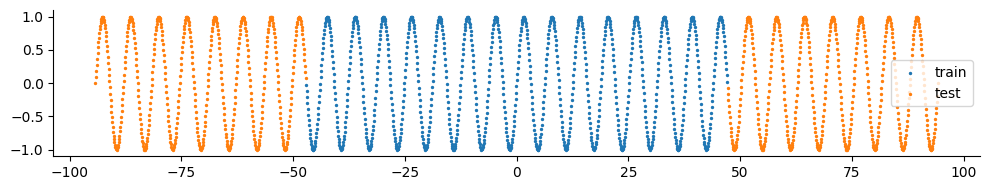

In [2]:
def gen_data(L=2000):

    x = torch.linspace(-30*torch.pi, 30*torch.pi, L)
    y = torch.sin(x)

    x_train = x[L//4: 3*L//4]
    y_train = y[L//4: 3*L//4]

    x_test = torch.concatenate([x[:L//4], x[3*L//4:]])
    y_test = torch.concatenate([y[:L//4], y[3*L//4:]])

    return x_train, y_train, x_test, y_test

x_train, y_train, x_test, y_test = gen_data(L=2000)

fig, axs = plt.subplots(1, 1, figsize=(10, 2))
plt.scatter(x_train, y_train, label='train', s=2)
plt.scatter(x_test, y_test, label='test', s=2)
plt.legend()
plt.tight_layout()
axs.spines[['right', 'top']].set_visible(False)

In [3]:
class MLP(nn.Module):
    def __init__(self, count_hidden, count_nodes, 
                 use_batchnorm, use_xavier_normal):
        super().__init__()

        # ------------------------
        # case 1 w batch norm
        if use_batchnorm:
            self.input_layer = nn.Sequential(*[
                nn.Linear(1, count_nodes),
                nn.BatchNorm1d(count_nodes),
                nn.ReLU(inplace=True),
            ])

            self.hidden_layer = nn.Sequential(*[
                nn.Linear(count_nodes, count_nodes),
                nn.BatchNorm1d(count_nodes),
                nn.ReLU(inplace=True),
            ] * count_hidden)

        # ------------------------
        # case 2 no batch norm
        elif not use_batchnorm:
            self.input_layer = nn.Sequential(*[
                nn.Linear(1, count_nodes),
                nn.ReLU(inplace=True),
            ])

            self.hidden_layer = nn.Sequential(*[
                nn.Linear(count_nodes, count_nodes),
                nn.ReLU(inplace=True),
            ] * count_hidden)            
            
        # output
        self.output_layer = nn.Linear(count_nodes, 1)

        # apply weights        
        if use_xavier_normal:
            self.apply(self._init_weights)

    def _init_weights(self, module):
        if isinstance(module, nn.Linear):
            torch.nn.init.xavier_normal_(module.weight)
            if module.bias is not None:
                module.bias.data.zero_()

    def forward(self, x):
        x = self.input_layer(x)
        x = self.hidden_layer(x)
        x = self.output_layer(x)
        
        return x

In [4]:
def train_model(model, epochs=1000):
    batch_size = len(x_train) - 1
    for k in range(epochs):

        # shuffle x_train
        inds = np.random.choice(range(len(x_train)), size=len(x_train), replace=False)

        x_inp = x_train[inds]
        y_inp = y_train[inds]

        batch_idx = np.random.choice(np.arange(0, len(x_train) - batch_size))        

        x_inp = x_inp[batch_idx : batch_idx + batch_size]
        y_inp = y_inp[batch_idx : batch_idx + batch_size]
        
        pred = model(x_inp[:, None])

        # loss
        loss = torch.mean((pred.squeeze() - y_inp)**2)
        
        optim.zero_grad()
        loss.backward()
        optim.step()
        scheduler.step()

        # if k%500 == 0:
        #     print("Loss:",loss.cpu().item())

    return model

In [5]:
def predict(model, x_inp):
    model.eval()
    ypred = model(x_inp[:, None])
    return ypred.cpu().detach().numpy()

In [6]:
def visualize(model, axs, title):

    y_pred_train = predict(model, x_train)
    y_pred_test = predict(model, x_test)

    
    axs.scatter(x_train, y_pred_train, s=1, marker='o', label='train')
    axs.scatter(x_test, y_pred_test, s=1, marker='o', label='test')

    axs.scatter(x_train, y_train, s=1, alpha=0.1)
    axs.scatter(x_test, y_test, s=1, alpha=0.1)
    axs.set_ylim(-1.5, 1.5)

    # axs.legend()
    axs.set_title(title)
    axs.spines[['right', 'top']].set_visible(False)
    # plt.tight_layout()

In [7]:
count_hidden = 8
count_nodes = 32
use_batchnorm = True
use_xavier_normal = True

model = MLP(count_hidden=count_hidden, count_nodes=count_nodes, 
            use_batchnorm=use_batchnorm, use_xavier_normal=use_xavier_normal)
optim = torch.optim.Adam(model.parameters(),lr=0.01)
scheduler = torch.optim.lr_scheduler.StepLR(optim, step_size= 1000)

In [8]:
# model.eval()
# weights = model.state_dict() #['hidden_layer.1.weight'].detach().numpy().T
# weight_layers = [i for i in weights.keys() if "hidden_layer" in i and "weight" in i]
# all_weights = [weights[weight_layers[i]].detach().numpy() for i in range(count_hidden)]
# all_weights[0].shape, all_weights[-1].shape
# weight_layers

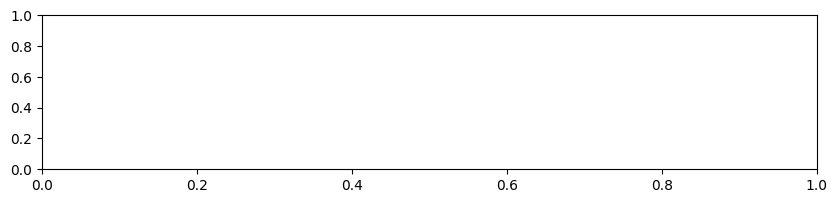

In [9]:
# animation
fig, axs = plt.subplots(1, 1, figsize=(10, 2)) # dpi=200)

def animate(iter):
    global model 

    epochs = 5
    model = train_model(model, epochs=epochs)    
    
    axs.clear()

    title = f"Hidden laters: {count_hidden} | Nodes: {count_nodes} Batch Norm: {use_batchnorm} | Xavier Init: {use_xavier_normal} | Training Epoch {epochs * iter}"
    visualize(model, axs, title)

    return None

We show an animation below of the neural network parameters (MLP) and the evolution of how it fits the data over its training (epochs). We find that while the network fits the training set well, it failed to extend the sine wave function in the test set. 

In [13]:
from PIL import Image
from matplotlib import animation
from IPython.display import HTML

anim = animation.FuncAnimation(fig, 
                               animate, 
                               frames=250, 
                               interval=1)
HTML(anim.to_jshtml(fps=60))

While I was initially surprised, I realized that making this highly unbiased MLP model generalize a sine function may be quite hard since there are an infinite possible functions that fit the same training set. There is no rule that tells the model that it has to extend the periodicity infinitely in both directions. In fact, this fitted model is just as valid as any of the functions that fit the data, from the perspective of the model.

In other words, we will need to incorporate our assumption that the periodicity extends infinitely, by introducing some inductive bias into the model, such that it is encouraged to find solutions that have periodicity.

Still, watching how the neural network learns to fit on the training data is quite fun!